In [2]:
import scanpy as sc
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.collections import PathCollection
import os

# Settings for inline plotting
%matplotlib inline
sc.settings.verbosity = 3
sc.set_figure_params(dpi=80, facecolor='white')

In [3]:
# Paths to your data
input_adata_path = "/mnt/data/melina/adata_all_batch_Epithelial.h5ad"
input_da_path = "/mnt/data/melina/da_Epithelial.nc"
comparison_key = "donor_disease_category"  # The variable used in your model
output_pdf_name = "differential_abundance_plots.pdf"

# 1. Load Data
print("Loading data...")
adata = sc.read_h5ad(input_adata_path)
da_res = xr.open_dataset(input_da_path)

print("Data loaded successfully.")

Loading data...
Data loaded successfully.


Plotting Reference Annotations...


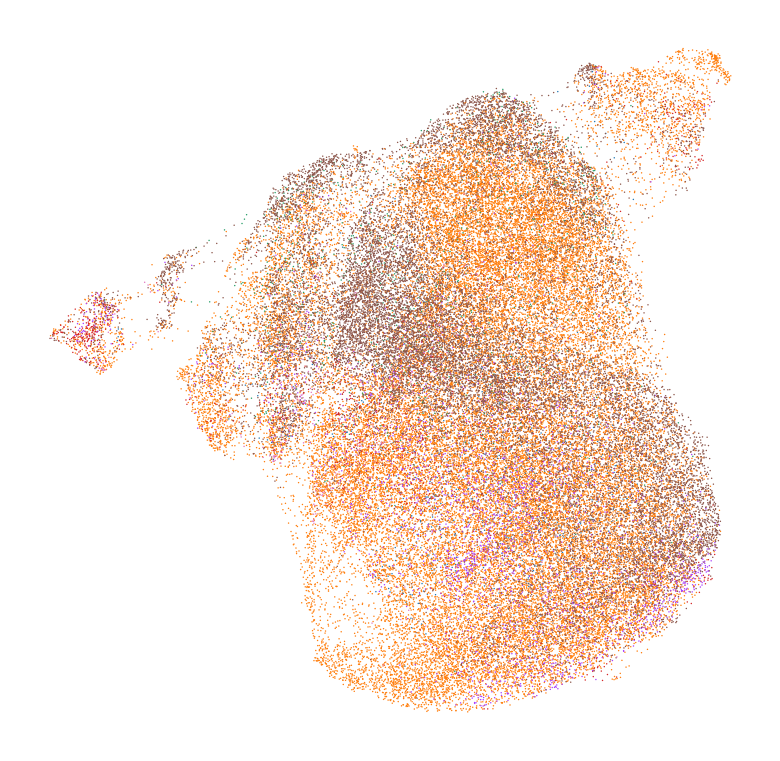

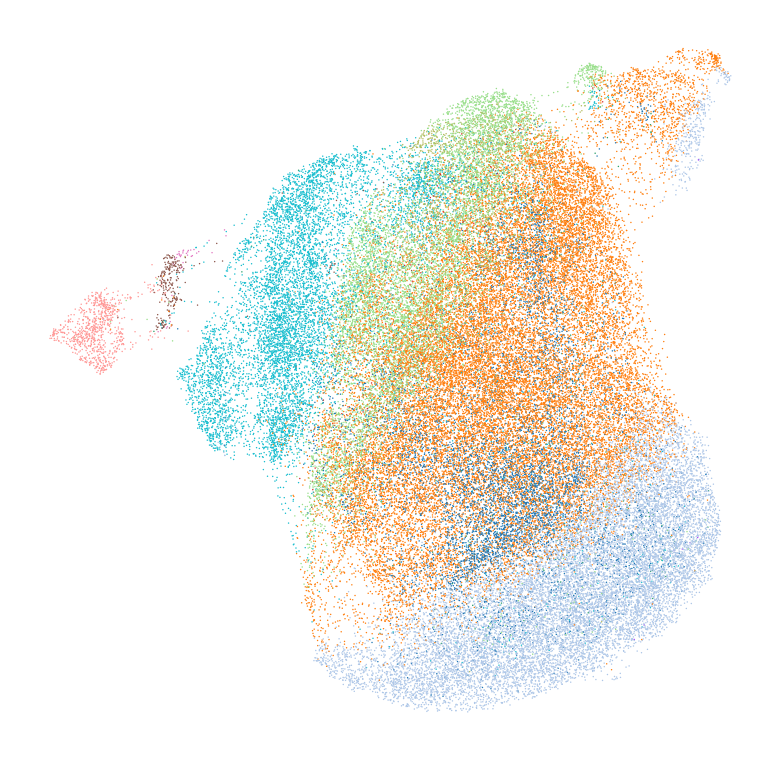

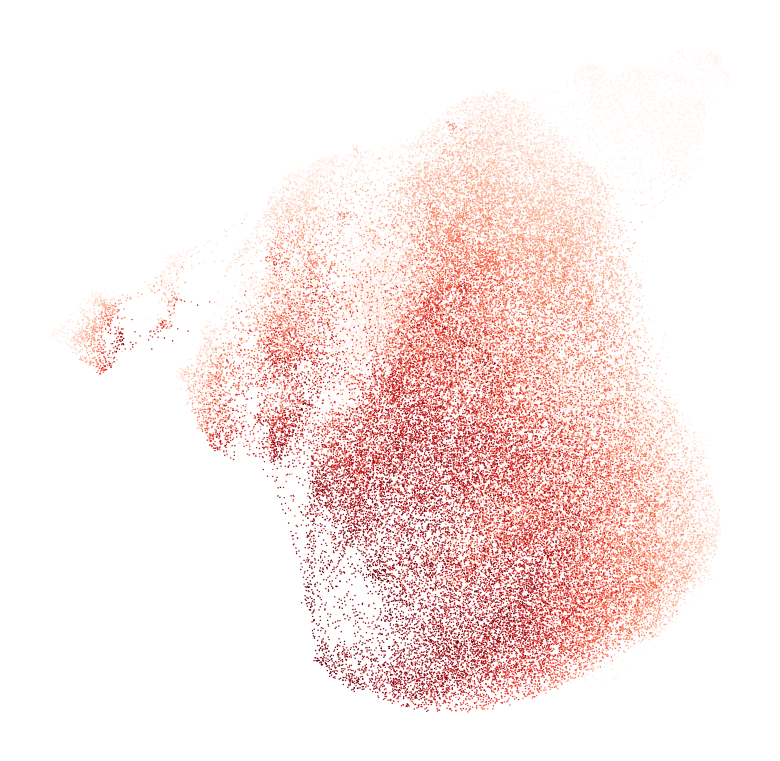

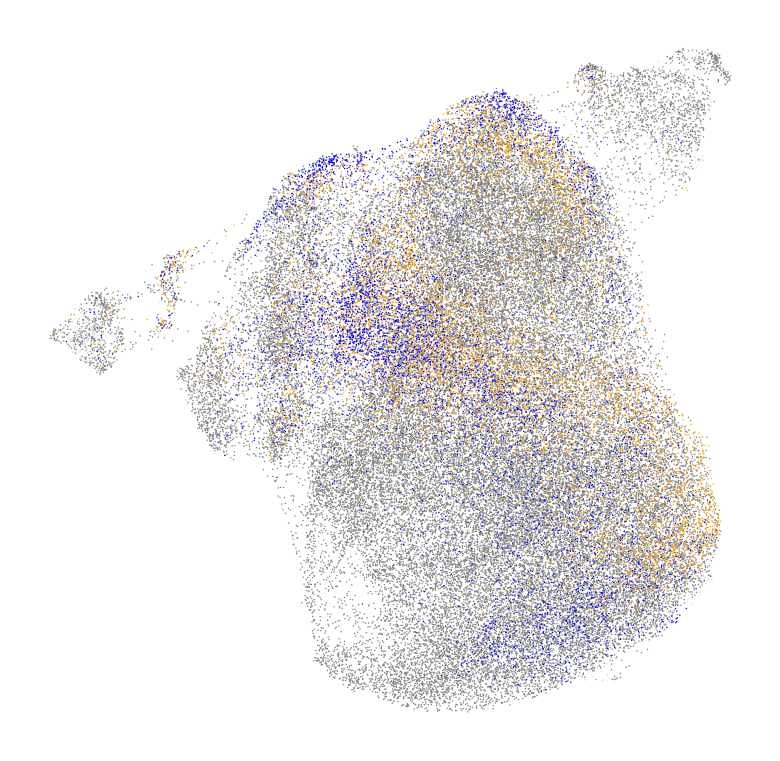

Comparing: UC_disease vs healthy_control


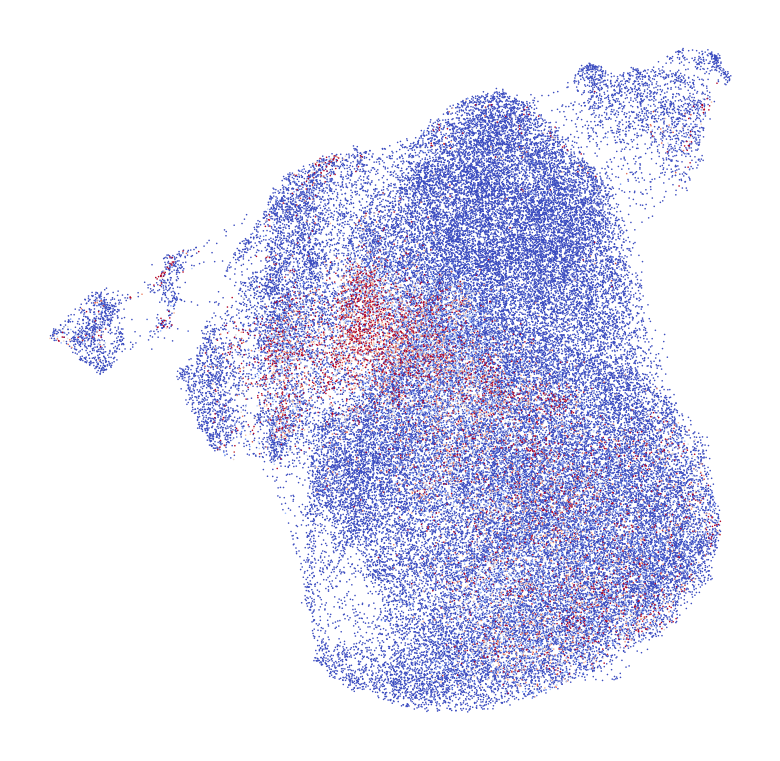

Comparing: UC_disease vs UC_control


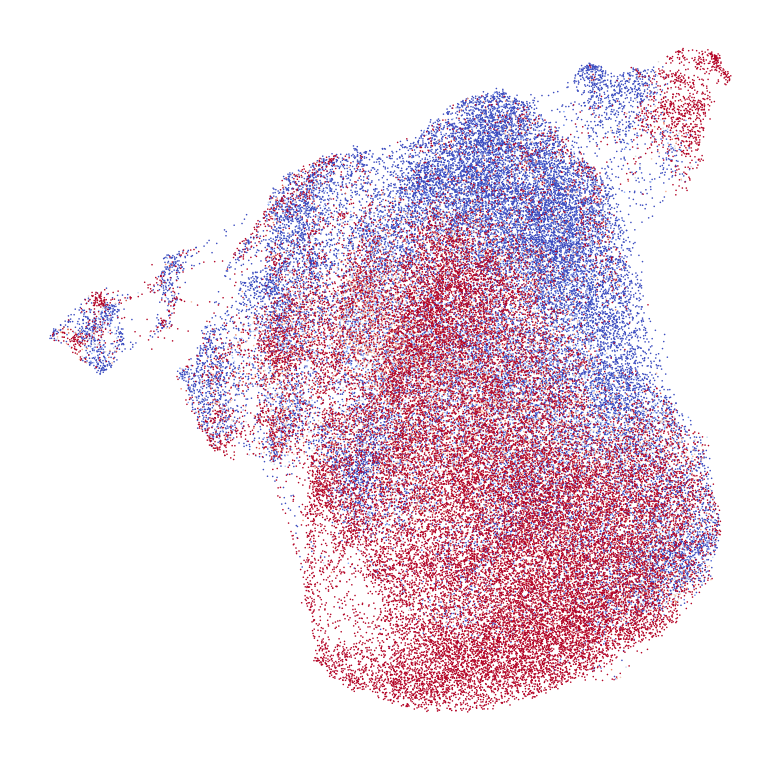

Comparing: UC_control vs healthy_control


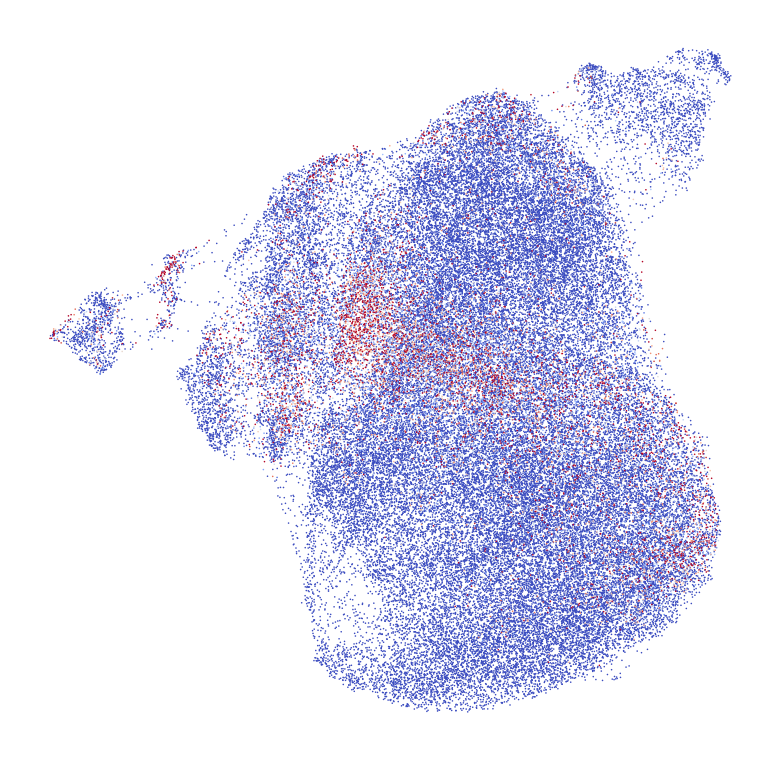


All plots finished! PDF saved to: /home/melrie/bc_pipeline/final_plots/differential_abundance_plots.pdf


In [16]:
# 2. Define Baseline Logic (Restricted to UC and Healthy Control only)
control_map = {"UC_disease": "UC_control"}
global_ref = "healthy_control"

# Filter categories so the loop only processes your exact targets
allowed_categories = ["UC_disease", "UC_control", "healthy_control"]
categories = [
    cat for cat in da_res[comparison_key].values if cat in allowed_categories
]

# ==========================================
# CUSTOM COLOR SCHEMES CONFIGURATION
# ==========================================

# 1. Base mapping for your targets
target_colors = {
    "healthy_control": "grey",
    "UC_control": "orange",
    "UC_disease": "blue"
}

# 2. Complete mapping dynamically for ALL categories present in your object
adata.obs["donor_disease_category"] = adata.obs["donor_disease_category"].astype("category")
all_existing_diseases = adata.obs["donor_disease_category"].cat.categories

color_dict_disease = {}
for disease in all_existing_diseases:
    if disease in target_colors:
        color_dict_disease[disease] = target_colors[disease]
    else:
        color_dict_disease[disease] = "#E0E0E0"  # Fallback light grey for CD, PIBD, etc.

# --- Study Mapping ---
color_dict_study = {
    "Study_A": "#1f77b4", 
    "Study_B": "#ff7f0e", 
}
adata.obs["study"] = adata.obs["study"].astype("category")
ordered_study_cats = adata.obs["study"].cat.categories
if all(cat in color_dict_study for cat in ordered_study_cats):
    adata.uns["study_colors"] = [color_dict_study[cat] for cat in ordered_study_cats]

# --- Level 3 Annotation Mapping ---
color_dict_annot = {
    "Epithelial_Type_1": "purple",
    "Epithelial_Type_2": "green",
}
adata.obs["level_3_annot"] = adata.obs["level_3_annot"].astype("category")
ordered_annot_cats = adata.obs["level_3_annot"].cat.categories
if all(cat in color_dict_annot for cat in ordered_annot_cats):
    adata.uns["level_3_annot_colors"] = [color_dict_annot[cat] for cat in ordered_annot_cats]

# ==========================================


# 3. Execution Loop
with PdfPages(output_pdf_name) as pdf:

    print("Plotting Reference Annotations...")

    # Plot Reference 1: study (Individual Plot)
    fig, ax = plt.subplots(figsize=(6, 6))
    sc.pl.embedding(
        adata,
        basis="umap_mrvi_u",
        color="study",
        frameon=False,
        legend_loc=None,
        title="",
        ax=ax,
        show=False,
    )
    for artist in ax.collections:
        if isinstance(artist, PathCollection):
            artist.set_rasterized(True)
    pdf.savefig(bbox_inches="tight", dpi=300)
    plt.show()
    plt.close(fig)

    # Plot Reference 2: level_3_annot (Individual Plot)
    fig, ax = plt.subplots(figsize=(6, 6))
    sc.pl.embedding(
        adata,
        basis="umap_mrvi_u",
        color="level_3_annot",
        frameon=False,
        legend_loc=None,
        title="",
        ax=ax,
        show=False,
    )
    for artist in ax.collections:
        if isinstance(artist, PathCollection):
            artist.set_rasterized(True)
    pdf.savefig(bbox_inches="tight", dpi=300)
    plt.show()
    plt.close(fig)

    # Plot Reference 3: Mitochondrial Counts (Individual Plot - Scale Removed)
    fig, ax = plt.subplots(figsize=(6, 6))
    sc.pl.embedding(
        adata,
        basis="umap_mrvi_u",
        color="pct_counts_mt",
        cmap="Reds",
        vmax="p99",
        frameon=False,
        legend_loc=None,
        colorbar_loc=None,  # <--- Removes the continuous colorbar scale
        title="",
        ax=ax,
        show=False,
    )
    for artist in ax.collections:
        if isinstance(artist, PathCollection):
            artist.set_rasterized(True)
    pdf.savefig(bbox_inches="tight", dpi=300)
    plt.show()
    plt.close(fig)

    # Plot Reference 4: Donor Disease Category (Individual Plot)
    fig, ax = plt.subplots(figsize=(6, 6))
    sc.pl.embedding(
        adata,
        basis="umap_mrvi_u",
        color="donor_disease_category",
        groups=allowed_categories,     
        palette=color_dict_disease,    
        frameon=False,
        legend_loc=None,  
        title="",
        ax=ax,
        show=False,
    )
    for artist in ax.collections:
        if isinstance(artist, PathCollection):
            artist.set_rasterized(True)
    pdf.savefig(bbox_inches="tight", dpi=300)
    plt.show()
    plt.close(fig)

    # Loop through filtered UC/Control categories for LFC comparisons
    for cat in categories:
        baselines = []

        if cat != global_ref:
            baselines.append(global_ref)

        specific_ref = control_map.get(cat)
        if specific_ref and specific_ref in categories:
            baselines.append(specific_ref)

        for ref in baselines:
            if cat == ref:
                continue

            print(f"Comparing: {cat} vs {ref}")

            # Calculate Log Prob Ratio (Log Fold Change equivalent)
            target_probs = da_res.donor_disease_category_log_probs.loc[
                {comparison_key: cat}
            ]
            ref_probs = da_res.donor_disease_category_log_probs.loc[
                {comparison_key: ref}
            ]
            lfc = target_probs - ref_probs

            # Map the results to the AnnData obs
            adata.obs["DA_lfc"] = lfc.to_series().reindex(adata.obs_names).values

            # Plot LFC (Individual Plot - Scale Removed)
            fig, ax = plt.subplots(figsize=(6, 6))
            sc.pl.embedding(
                adata,
                basis="umap_mrvi_u",
                color="DA_lfc",
                cmap="coolwarm",
                vmin=-5,
                vmax=5,
                size=2.0,
                frameon=False,
                legend_loc=None,
                colorbar_loc=None,  # <--- Removes the continuous colorbar scale
                title="",
                ax=ax,
                show=False,
            )

            for artist in ax.collections:
                if isinstance(artist, PathCollection):
                    artist.set_rasterized(True)

            pdf.savefig(bbox_inches="tight", dpi=300)
            plt.show()
            plt.close(fig)

print(f"\nAll plots finished! PDF saved to: {os.path.abspath(output_pdf_name)}")

Plotting Reference Annotations...


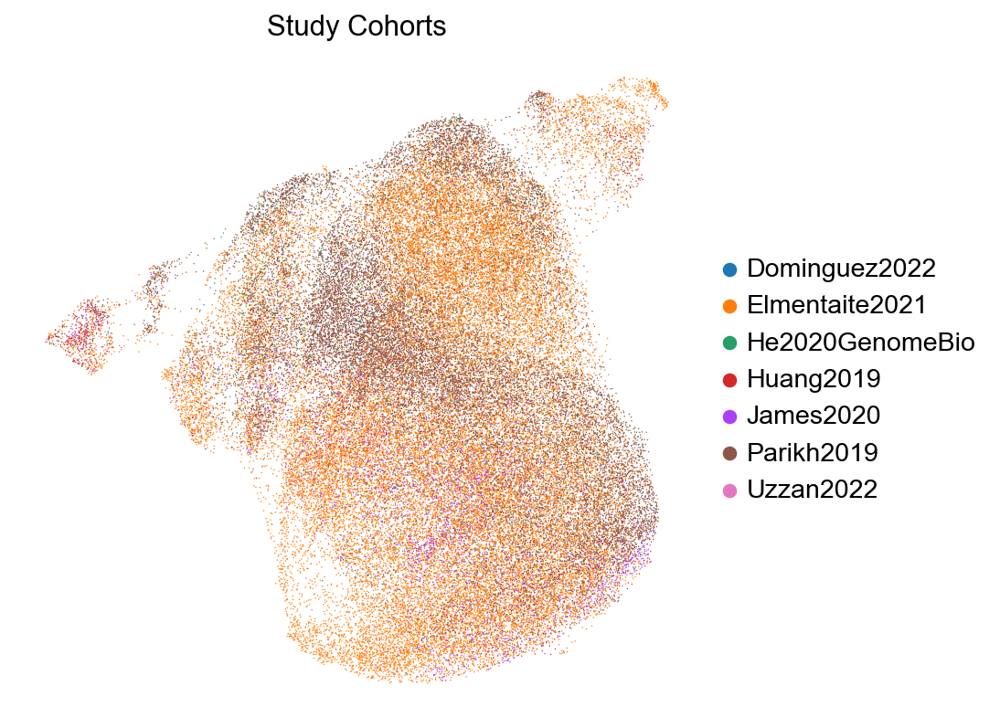

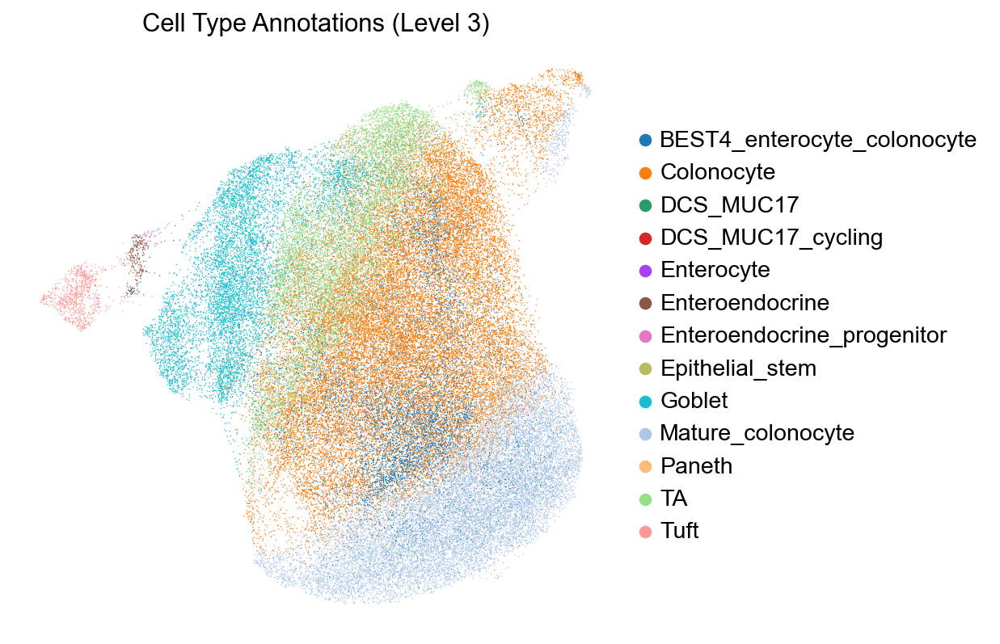

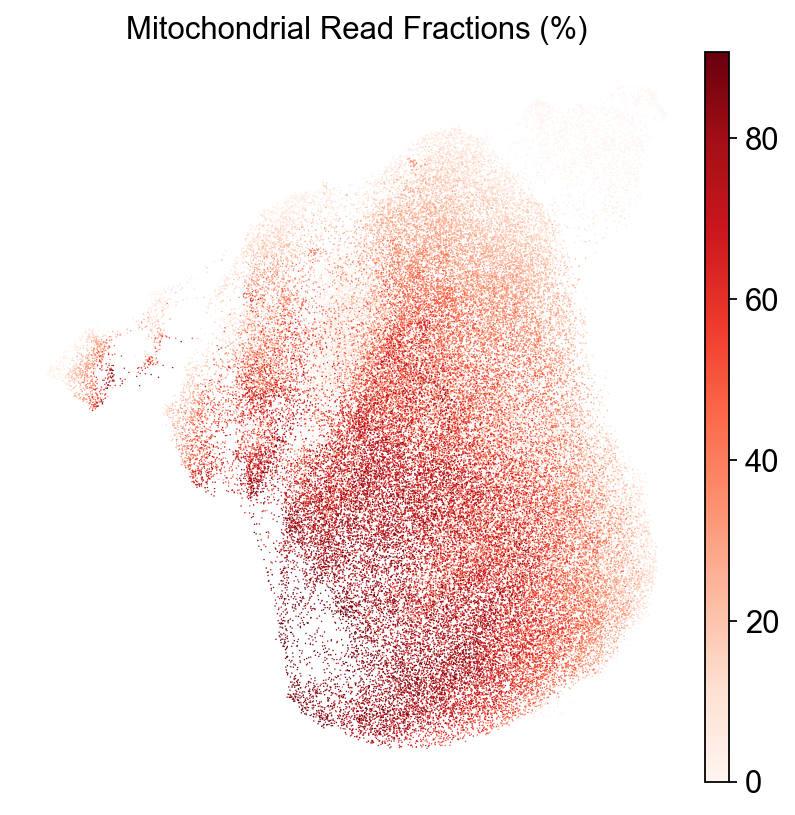

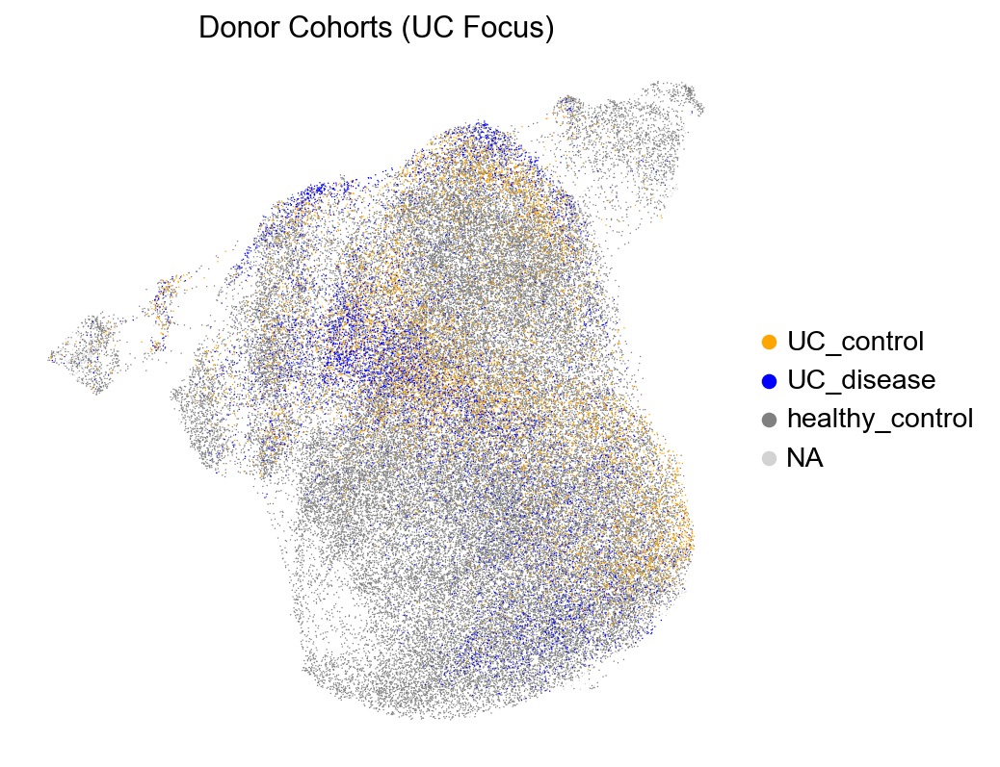

Comparing: UC_disease vs healthy_control


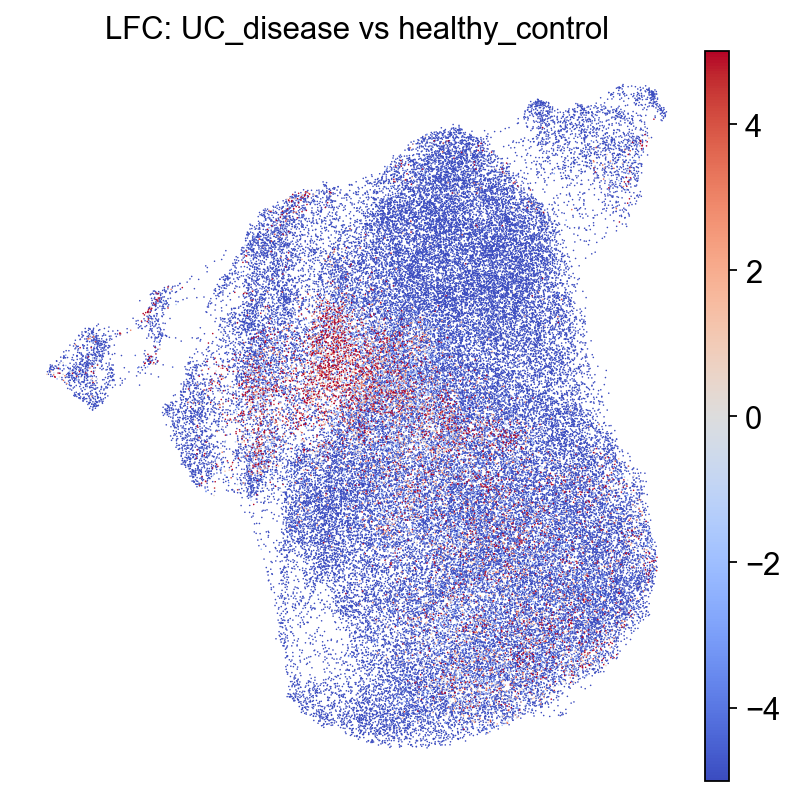

Comparing: UC_disease vs UC_control


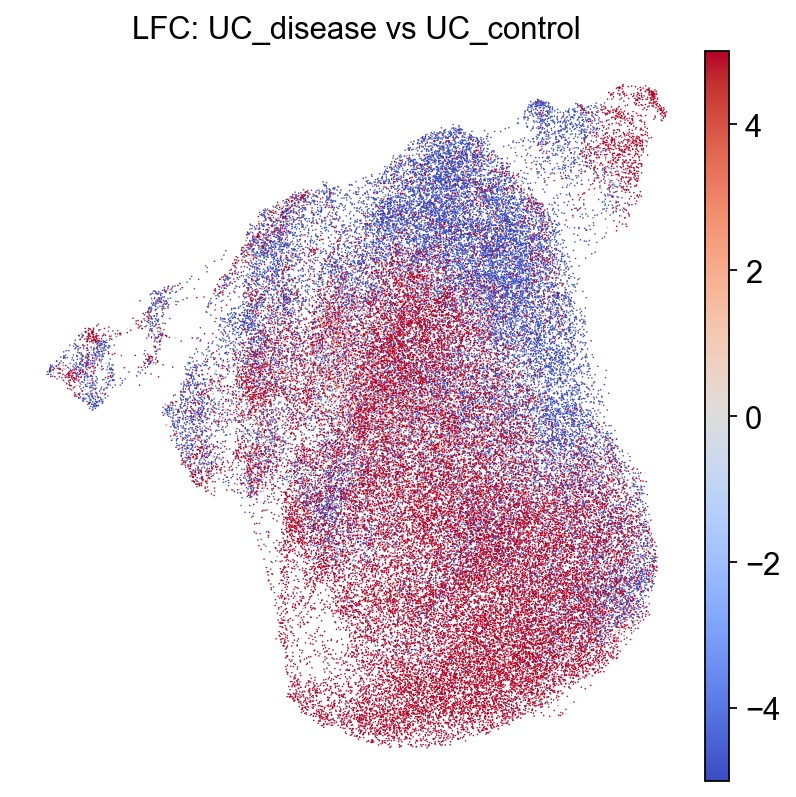

Comparing: UC_control vs healthy_control


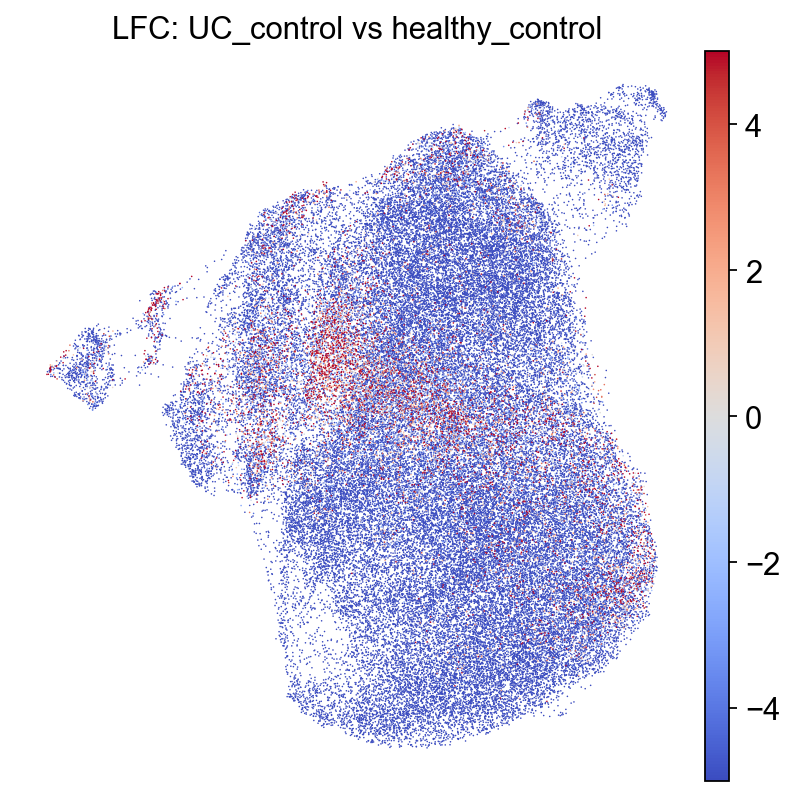


All plots finished! PDF saved to: /home/melrie/bc_pipeline/final_plots/differential_abundance_plots.pdf


In [17]:
# 2. Define Baseline Logic (Restricted to UC and Healthy Control only)
control_map = {"UC_disease": "UC_control"}
global_ref = "healthy_control"

# Filter categories so the loop only processes your exact targets
allowed_categories = ["UC_disease", "UC_control", "healthy_control"]
categories = [
    cat for cat in da_res[comparison_key].values if cat in allowed_categories
]

# ==========================================
# CUSTOM COLOR SCHEMES CONFIGURATION
# ==========================================

# 1. Base mapping for your targets
target_colors = {
    "healthy_control": "grey",
    "UC_control": "orange",
    "UC_disease": "blue"
}

# 2. Complete mapping dynamically for ALL categories present in your object
adata.obs["donor_disease_category"] = adata.obs["donor_disease_category"].astype("category")
all_existing_diseases = adata.obs["donor_disease_category"].cat.categories

color_dict_disease = {}
for disease in all_existing_diseases:
    if disease in target_colors:
        color_dict_disease[disease] = target_colors[disease]
    else:
        color_dict_disease[disease] = "#E0E0E0"  # Fallback light grey for CD, PIBD, etc.

# --- Study Mapping ---
color_dict_study = {
    "Study_A": "#1f77b4", 
    "Study_B": "#ff7f0e", 
}
adata.obs["study"] = adata.obs["study"].astype("category")
ordered_study_cats = adata.obs["study"].cat.categories
if all(cat in color_dict_study for cat in ordered_study_cats):
    adata.uns["study_colors"] = [color_dict_study[cat] for cat in ordered_study_cats]

# --- Level 3 Annotation Mapping ---
color_dict_annot = {
    "Epithelial_Type_1": "purple",
    "Epithelial_Type_2": "green",
}
adata.obs["level_3_annot"] = adata.obs["level_3_annot"].astype("category")
ordered_annot_cats = adata.obs["level_3_annot"].cat.categories
if all(cat in color_dict_annot for cat in ordered_annot_cats):
    adata.uns["level_3_annot_colors"] = [color_dict_annot[cat] for cat in ordered_annot_cats]

# ==========================================


# 3. Execution Loop
with PdfPages(output_pdf_name) as pdf:

    print("Plotting Reference Annotations...")

    # Plot Reference 1: study (Individual Plot)
    fig, ax = plt.subplots(figsize=(6, 6))
    sc.pl.embedding(
        adata,
        basis="umap_mrvi_u",
        color="study",
        frameon=False,
        legend_loc="right margin",  # Restored label legend
        title="Study Cohorts",       # Added descriptive title
        ax=ax,
        show=False,
    )
    for artist in ax.collections:
        if isinstance(artist, PathCollection):
            artist.set_rasterized(True)
    pdf.savefig(bbox_inches="tight", dpi=300)
    plt.show()
    plt.close(fig)

    # Plot Reference 2: level_3_annot (Individual Plot)
    fig, ax = plt.subplots(figsize=(6, 6))
    sc.pl.embedding(
        adata,
        basis="umap_mrvi_u",
        color="level_3_annot",
        frameon=False,
        legend_loc="right margin",  # Restored label legend
        title="Cell Type Annotations (Level 3)", # Added descriptive title
        ax=ax,
        show=False,
    )
    for artist in ax.collections:
        if isinstance(artist, PathCollection):
            artist.set_rasterized(True)
    pdf.savefig(bbox_inches="tight", dpi=300)
    plt.show()
    plt.close(fig)

    # Plot Reference 3: Mitochondrial Counts (Individual Plot)
    fig, ax = plt.subplots(figsize=(6, 6))
    sc.pl.embedding(
        adata,
        basis="umap_mrvi_u",
        color="pct_counts_mt",
        cmap="Reds",
        vmax="p99",
        frameon=False,
        colorbar_loc="right",         # Restored continuous scale colorbar
        title="Mitochondrial Read Fractions (%)", # Added title
        ax=ax,
        show=False,
    )
    for artist in ax.collections:
        if isinstance(artist, PathCollection):
            artist.set_rasterized(True)
    pdf.savefig(bbox_inches="tight", dpi=300)
    plt.show()
    plt.close(fig)

    # Plot Reference 4: Donor Disease Category (Individual Plot)
    fig, ax = plt.subplots(figsize=(6, 6))
    sc.pl.embedding(
        adata,
        basis="umap_mrvi_u",
        color="donor_disease_category",
        groups=allowed_categories,     
        palette=color_dict_disease,    
        frameon=False,
        legend_loc="right margin",  # Restored label legend
        title="Donor Cohorts (UC Focus)", # Added title
        ax=ax,
        show=False,
    )
    for artist in ax.collections:
        if isinstance(artist, PathCollection):
            artist.set_rasterized(True)
    pdf.savefig(bbox_inches="tight", dpi=300)
    plt.show()
    plt.close(fig)

    # Loop through filtered UC/Control categories for LFC comparisons
    for cat in categories:
        baselines = []

        if cat != global_ref:
            baselines.append(global_ref)

        specific_ref = control_map.get(cat)
        if specific_ref and specific_ref in categories:
            baselines.append(specific_ref)

        for ref in baselines:
            if cat == ref:
                continue

            print(f"Comparing: {cat} vs {ref}")

            # Calculate Log Prob Ratio (Log Fold Change equivalent)
            target_probs = da_res.donor_disease_category_log_probs.loc[
                {comparison_key: cat}
            ]
            ref_probs = da_res.donor_disease_category_log_probs.loc[
                {comparison_key: ref}
            ]
            lfc = target_probs - ref_probs

            # Map the results to the AnnData obs
            adata.obs["DA_lfc"] = lfc.to_series().reindex(adata.obs_names).values

            # Plot LFC (Individual Plot)
            fig, ax = plt.subplots(figsize=(6, 6))
            sc.pl.embedding(
                adata,
                basis="umap_mrvi_u",
                color="DA_lfc",
                cmap="coolwarm",
                vmin=-5,
                vmax=5,
                size=2.0,
                frameon=False,
                colorbar_loc="right",  # Restored continuous scale colorbar
                title=f"LFC: {cat} vs {ref}", # Added clear comparison titles
                ax=ax,
                show=False,
            )

            for artist in ax.collections:
                if isinstance(artist, PathCollection):
                    artist.set_rasterized(True)

            pdf.savefig(bbox_inches="tight", dpi=300)
            plt.show()
            plt.close(fig)

print(f"\nAll plots finished! PDF saved to: {os.path.abspath(output_pdf_name)}")